In [28]:
import numpy as np
import pandas as pd
import os
import geopy.distance as distance
import random
import pickle
import matplotlib.pyplot as plt
import matplotlib
import tslearn
import warnings
from pydtw import dtw2d
import PIL.Image as img
warnings.filterwarnings('ignore')
matplotlib.rcParams.update({'font.size': 20})
from IPython.display import clear_output
from IPython.display import Image, display


### Import Data

In [2]:
# import trip stats
with (open('/scratch/skp454/Trajectory/data/20190902_AISTripStatsData.pkl', "rb")) as openfile:
    df_tripStat = pickle.load(openfile, encoding = 'latin1')

# import trip main
with (open('/scratch/skp454/Trajectory/data/20190902_AISTripMainData.pkl', "rb")) as openfile:
    df_tripMain = pickle.load(openfile, encoding = 'latin1')
    df_tripMain = df_tripMain[df_tripMain['trip_id'].isin(df_tripStat['trip_id'].unique())]
    df_tripMain.index = df_tripMain['point_id'] 
    df_tripMain['BaseDateTime'] = pd.to_datetime(df_tripMain['BaseDateTime'])
    
# import missing summary
with (open('/scratch/skp454/Trajectory/data/20190916_MissingSummary.pkl', "rb")) as openfile:
    df_missing = pickle.load(openfile, encoding = 'latin1')

#### Visualize Trip and Missing Segment

In [82]:
# Select a Trip with missing segment
row = df_missing.loc[401,:]

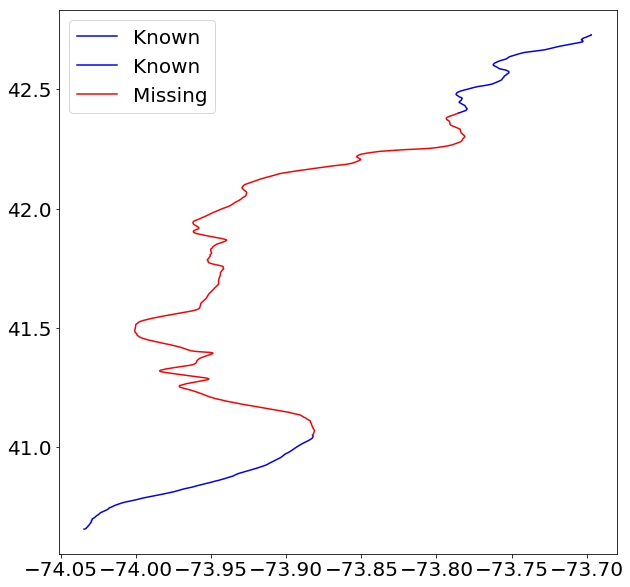

In [83]:
# Get points for before after and missing segment
df_p1 = df_tripMain.loc[row['min']:row['miss_from_point_id'],:]
df_p2 = df_tripMain.loc[row['miss_to_point_id']:row['max'],:]
df_miss = df_tripMain.loc[row['miss_from_point_id']:row['miss_to_point_id'],:]

# plot before after and missing segment
plt.subplots(figsize = (10,10))
plt.plot(df_p1['LON'], df_p1['LAT'], color = 'blue', label = 'Known')
plt.plot(df_p2['LON'], df_p2['LAT'], color = 'blue', label = 'Known')
plt.plot(df_miss['LON'], df_miss['LAT'],color = 'red', label = 'Missing')
plt.legend()

### Step1: Find Similar Trips

#### 1.1: Create Interest Zone of 1Km around the first and last known points of the missing segment

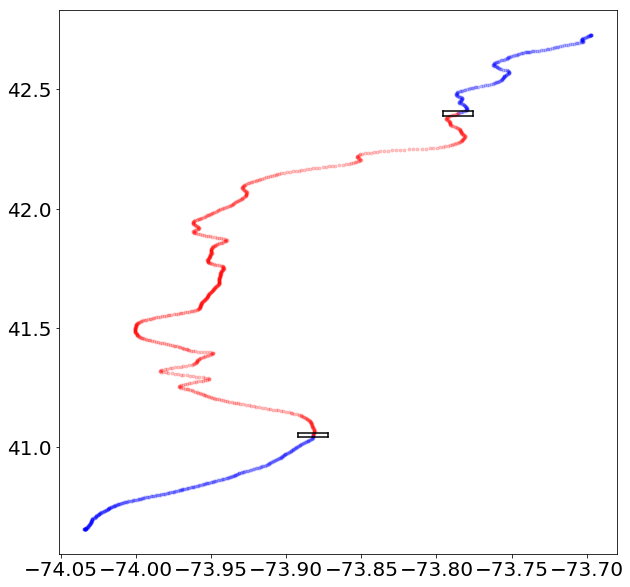

In [84]:
# create bounding boxes

# bounding box for last known point before missing segment
df_temp1 = df_tripMain[df_tripMain['point_id']==row['miss_from_point_id']]

U_Lat1 = df_temp1.iloc[0,2]+0.01
L_Lat1 = df_temp1.iloc[0,2]-0.01
U_Lon1 = df_temp1.iloc[0,3]+0.01
L_Lon1 = df_temp1.iloc[0,3]-0.01

# bounding box for last known point after missing segment
df_temp2 = df_tripMain[df_tripMain['point_id']==row['miss_to_point_id']]

U_Lat2 = df_temp2.iloc[0,2]+0.01
L_Lat2 = df_temp2.iloc[0,2]-0.01
U_Lon2 = df_temp2.iloc[0,3]+0.01
L_Lon2 = df_temp2.iloc[0,3]-0.01

# plot
# plot before after and missing segment
plt.subplots(figsize =(10,10))
plt.plot(df_p1['LON'], df_p1['LAT'], '.', color = 'blue', label = 'Known', alpha =0.2)
plt.plot(df_p2['LON'], df_p2['LAT'], '.', color = 'blue', label = 'Known', alpha =0.2)
plt.plot(df_miss['LON'], df_miss['LAT'],'.',color = 'red', label = 'Missing', alpha =0.2)

plt.plot([L_Lon1,L_Lon1],[L_Lat1,U_Lat1], color= 'black')
plt.plot([U_Lon1,U_Lon1],[L_Lat1,U_Lat1], color= 'black')
plt.plot([L_Lon1,U_Lon1],[L_Lat1,L_Lat1], color= 'black')
plt.plot([L_Lon1,U_Lon1],[U_Lat1,U_Lat1], color= 'black')

plt.plot([L_Lon2,L_Lon2],[L_Lat2,U_Lat2], color= 'black')
plt.plot([U_Lon2,U_Lon2],[L_Lat2,U_Lat2], color= 'black')
plt.plot([L_Lon2,U_Lon2],[L_Lat2,L_Lat2], color= 'black')
plt.plot([L_Lon2,U_Lon2],[U_Lat2,U_Lat2], color= 'black')

plt.show()

#### 1.2: Find points lying in the interest zones

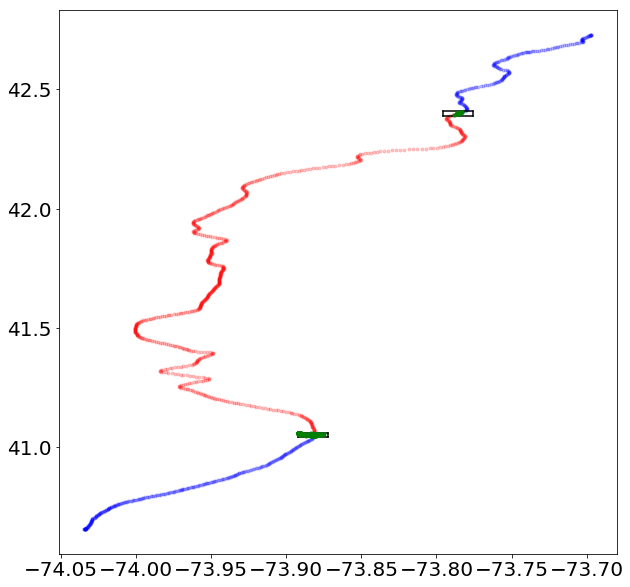

In [85]:
df_1 = df_tripMain[(df_tripMain['LAT']<=U_Lat1)&(df_tripMain['LAT']>=L_Lat1)\
                   &(df_tripMain['LON']<=U_Lon1)&(df_tripMain['LON']>=L_Lon1)\
                   &(df_tripMain['trip_id']!=row['trip_id'])]
df_1['point_dist'] = df_1.apply(lambda x: distance.distance((x['LAT'],x['LON']),\
                                                            (df_temp1.iloc[0,2],df_temp1.iloc[0,3])).km, axis=1)
df_1 = df_1.loc[df_1.groupby('trip_id')['point_dist'].idxmin()]
#df_1 = df_1[['trip_id','point_id','point_dist']]

df_2 = df_tripMain[(df_tripMain['LAT']<=U_Lat2)&(df_tripMain['LAT']>=L_Lat2)\
                   &(df_tripMain['LON']<=U_Lon2)&(df_tripMain['LON']>=L_Lon2)\
                   &(df_tripMain['trip_id']!=row['trip_id'])]
df_2['point_dist'] = df_2.apply(lambda x: distance.distance((x['LAT'],x['LON']),\
                                                            (df_temp2.iloc[0,2],df_temp2.iloc[0,3])).km, axis=1)
df_2 = df_2.loc[df_2.groupby('trip_id')['point_dist'].idxmin()]
#df_2 = df_2[['trip_id','point_id','point_dist']]

# plot
# plot before after and missing segment
plt.subplots(figsize =(10,10))
plt.plot(df_p1['LON'], df_p1['LAT'], '.', color = 'blue', label = 'Known', alpha =0.2)
plt.plot(df_p2['LON'], df_p2['LAT'], '.', color = 'blue', label = 'Known', alpha =0.2)
plt.plot(df_miss['LON'], df_miss['LAT'],'.',color = 'red', label = 'Missing', alpha =0.2)

plt.plot([L_Lon1,L_Lon1],[L_Lat1,U_Lat1], color= 'black')
plt.plot([U_Lon1,U_Lon1],[L_Lat1,U_Lat1], color= 'black')
plt.plot([L_Lon1,U_Lon1],[L_Lat1,L_Lat1], color= 'black')
plt.plot([L_Lon1,U_Lon1],[U_Lat1,U_Lat1], color= 'black')

plt.plot([L_Lon2,L_Lon2],[L_Lat2,U_Lat2], color= 'black')
plt.plot([U_Lon2,U_Lon2],[L_Lat2,U_Lat2], color= 'black')
plt.plot([L_Lon2,U_Lon2],[L_Lat2,L_Lat2], color= 'black')
plt.plot([L_Lon2,U_Lon2],[U_Lat2,U_Lat2], color= 'black')

plt.plot(df_1['LON'], df_1['LAT'], '.', color = 'green')
plt.plot(df_2['LON'], df_2['LAT'], '.', color = 'green')
plt.show()


#### 1.3: Extracts trips with points in both interest zones

In [86]:
df = df_1[['trip_id','point_id','point_dist']].merge(df_2[['trip_id','point_id','point_dist']]\
                                                     , on = 'trip_id', how = 'inner')
print('Total number of similar trips: '+str(len(df)))

Total number of similar trips: 153


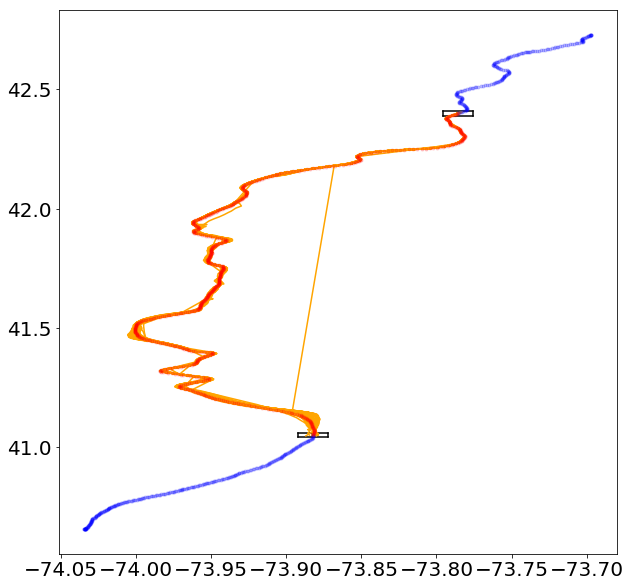

In [87]:
# plot
# plot before after and missing segment
plt.subplots(figsize =(10,10))

plt.plot([L_Lon1,L_Lon1],[L_Lat1,U_Lat1], color= 'black')
plt.plot([U_Lon1,U_Lon1],[L_Lat1,U_Lat1], color= 'black')
plt.plot([L_Lon1,U_Lon1],[L_Lat1,L_Lat1], color= 'black')
plt.plot([L_Lon1,U_Lon1],[U_Lat1,U_Lat1], color= 'black')

plt.plot([L_Lon2,L_Lon2],[L_Lat2,U_Lat2], color= 'black')
plt.plot([U_Lon2,U_Lon2],[L_Lat2,U_Lat2], color= 'black')
plt.plot([L_Lon2,U_Lon2],[L_Lat2,L_Lat2], color= 'black')
plt.plot([L_Lon2,U_Lon2],[U_Lat2,U_Lat2], color= 'black')


for i in df.index:
    if df.loc[i,'point_id_x'] >  df.loc[i,'point_id_y']:
        index = np.arange(df.loc[i,'point_id_x'], df.loc[i,'point_id_y']-1,-1)
    else:
        index = np.arange(df.loc[i,'point_id_x'], df.loc[i,'point_id_y']+1,1)
    df_temp = df_tripMain.loc[index, ['LAT','LON']]
    plt.plot(df_temp['LON'], df_temp['LAT'], color = 'orange')

plt.plot(df_p1['LON'], df_p1['LAT'], '.', color = 'blue', label = 'Known', alpha =0.2)
plt.plot(df_p2['LON'], df_p2['LAT'], '.', color = 'blue', label = 'Known', alpha =0.2)
plt.plot(df_miss['LON'], df_miss['LAT'],'.',color = 'red', label = 'Missing', alpha =0.2)
    
plt.show()

**Orange Lines Corresponds to the extracted trips which have points in both the interest zones**

### Step2: Get Predictions
1. We use DTW to get predictions from extracted similar trips.
2. DTW is used as the extracted similar trips may not have same number of time steps.
3. As DTW cannot take more than 2 sequeneces as input, we get predictions iteratively.
4. Initially 2 trips from the set of similar trips are taken and a DTW path is obtained between them.
5. In the next iteration, we find DTW path between a new trip from the set of similar trips and the DTW path obtained in the last iteration.
6. This process moves iteratively till all the trips from set of similar trips are used. Also, the weight to the DTW path is increased with every iteration.

In [88]:
df['steps'] = abs(df['point_id_y'] - df['point_id_x'])
df.sort_values(by = 'steps', inplace = True)
df.reset_index(drop = True, inplace = True)

i = 0
if df.loc[i,'point_id_x'] >  df.loc[i,'point_id_y']:
    index = np.arange(df.loc[i,'point_id_x'], df.loc[i,'point_id_y']-1,-1)
else:
    index = np.arange(df.loc[i,'point_id_x'], df.loc[i,'point_id_y']+1,1)

df_path = df_tripMain.loc[index, ['LAT','LON']]

try:
    os.mkdir('./image/'+str(row['missing_id']))
except FileExistsError:
    print("File Already Present")
    
for i in range(1,len(df)):
    if df.loc[i,'point_id_x'] >  df.loc[i,'point_id_y']:
        index = np.arange(df.loc[i,'point_id_x'], df.loc[i,'point_id_y']-1,-1)
    else:
        index = np.arange(df.loc[i,'point_id_x'], df.loc[i,'point_id_y']+1,1)
    df_temp = df_tripMain.loc[index, ['LAT','LON']]
    
    df_temp.reset_index(inplace=True, drop=True)
    df_path.reset_index(inplace=True, drop=True)
    cost_matrix, cost, alignmend_a, alignmend_b = dtw2d(np.array(df_temp).copy(order='C'), np.array(df_path).copy(order='C'))
    df_new = pd.DataFrame(data = (np.array(df_temp.loc[alignmend_a]) + (np.array(df_path.loc[alignmend_b])*i))/(i+1)\
                          , columns = ['LAT','LON'])
    plt.subplots(figsize = (10,10))
    plt.plot(df_p1['LON'], df_p1['LAT'], '.', color = 'blue', label = 'Known', alpha =0.1)
    plt.plot(df_p2['LON'], df_p2['LAT'], '.', color = 'blue', label = 'Known', alpha =0.1)
    plt.plot(df_miss['LON'], df_miss['LAT'], marker = 'o',color = 'red', label = 'Missing', alpha =0.1)
    plt.plot(df_path['LON'], df_path['LAT'],'.' ,label = 'Last DTW PATH')
    plt.plot(df_temp['LON'], df_temp['LAT'], '.' ,label = 'New Trip')
    plt.plot(df_new['LON'], df_new['LAT'], label = 'Obtained DTW Path')
    plt.title('Iteration: '+str(i))
    plt.legend()
    plt.savefig('./image/'+str(row['missing_id'])+'/'+str(i)+'.png')
    df_path = df_new
    df_path.drop_duplicates(inplace =True)
    plt.close()

im1 = img.open('./image/'+str(row['missing_id'])+'/1.png')
append_images=[]
for hour in range(2,len(df)):
    append_images.append(img.open('./image/'+str(row['missing_id'])+'/'+str(hour)+'.png'))

im1.save('./image/gif/'+str(row['missing_id'])+'.gif', save_all=True, append_images=append_images, duration=hour*1, loop=0)

File Already Present


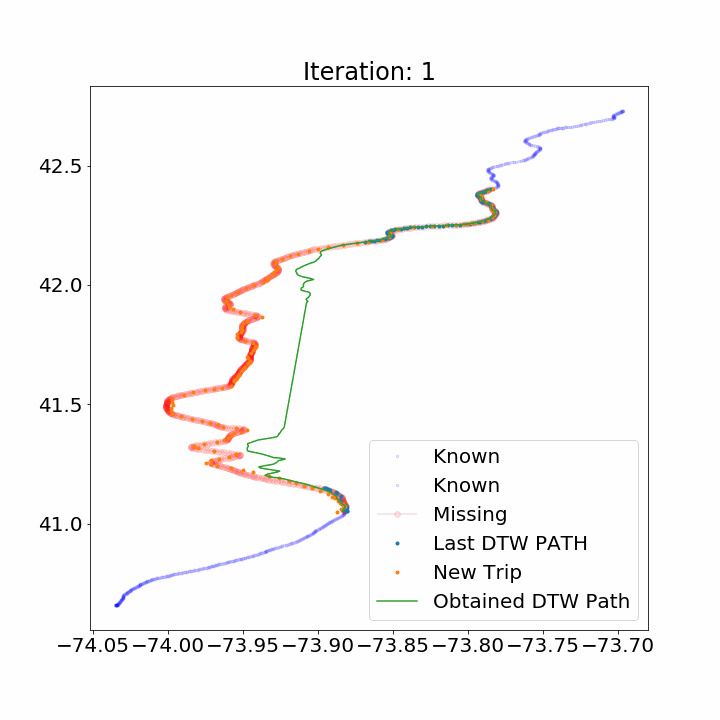

In [89]:
with open('/scratch/skp454/Trajectory/src/image/gif/'+str(row['missing_id'])+'.gif','rb') as f:
    display(Image(data=f.read(), format='gif'))

### Step 3: Evaluation

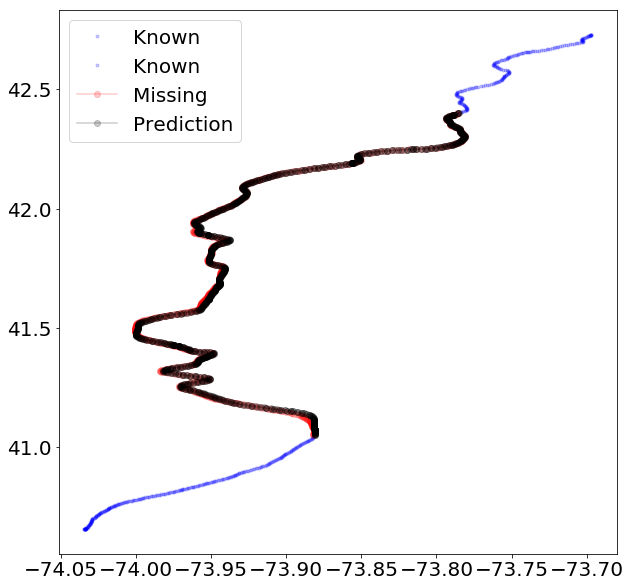

In [90]:
## Visual evaluation
plt.subplots(figsize=(10,10))
plt.plot(df_p1['LON'], df_p1['LAT'], '.', color = 'blue', label = 'Known', alpha =0.2)
plt.plot(df_p2['LON'], df_p2['LAT'], '.', color = 'blue', label = 'Known', alpha =0.2)
plt.plot(df_miss['LON'], df_miss['LAT'],marker = 'o',color = 'red', label = 'Missing', alpha =0.2)
plt.plot(df_path['LON'], df_path['LAT'],marker = 'o',color = 'black', label = 'Prediction', alpha =0.2)

plt.legend()

In [138]:
# make number of points in prediction similar to that of missing segment
df_path['index'] = df_path.index
df_path['temp'] = (df_path['index']*len(df_miss)/len(df_path)).astype(int)
df_path1 = df_path.loc[df_path.groupby('temp')['index'].idxmin()]
df_path1.drop(['index','temp'], inplace = True, axis =1)
df_path1.reset_index(inplace = True, drop = True)
cost_matrix, cost, alignmend_a, alignmend_b = dtw2d(np.array(df_miss[['LAT','LON']]).copy(order='C'), np.array(df_path1).copy(order='C'))

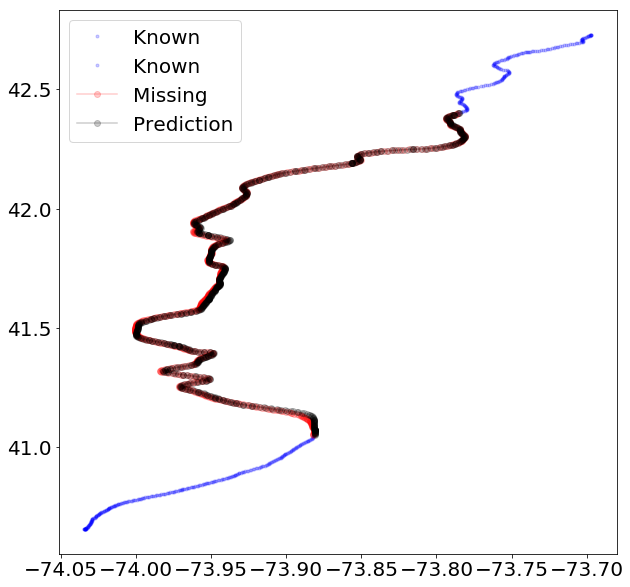

In [141]:
## Visual evaluation after resampling
plt.subplots(figsize=(10,10))
plt.plot(df_p1['LON'], df_p1['LAT'], '.', color = 'blue', label = 'Known', alpha =0.2)
plt.plot(df_p2['LON'], df_p2['LAT'], '.', color = 'blue', label = 'Known', alpha =0.2)
plt.plot(df_miss['LON'], df_miss['LAT'],marker = 'o',color = 'red', label = 'Missing', alpha =0.2)
#plt.plot(df_path1['LON'], df_path1['LAT'],marker = 'o',color = 'black', label = 'Prediction', alpha =0.2)
plt.plot(df_path1.loc[alignmend_b,'LON'], df_path1.loc[alignmend_b,'LAT'], marker = 'o',\
         color = 'black', label = 'Prediction', alpha =0.2)

plt.legend()

#### 3.1: Comparison with Linear Interpolation

In [158]:
# linear interpolation
df_miss.iloc[0,5] = 0
df_miss['TimeCumSum'] = df_miss['TimeDiff'].cumsum()
df_miss['pLAT'] = ((df_miss.iloc[-1,2] - df_miss.iloc[0,2])/max(df_miss['TimeCumSum']) * df_miss['TimeCumSum'])\
+ df_miss.iloc[0,2]
df_miss['pLON'] = ((df_miss.iloc[-1,3] - df_miss.iloc[0,3])/max(df_miss['TimeCumSum']) * df_miss['TimeCumSum'])\
+ df_miss.iloc[0,3]

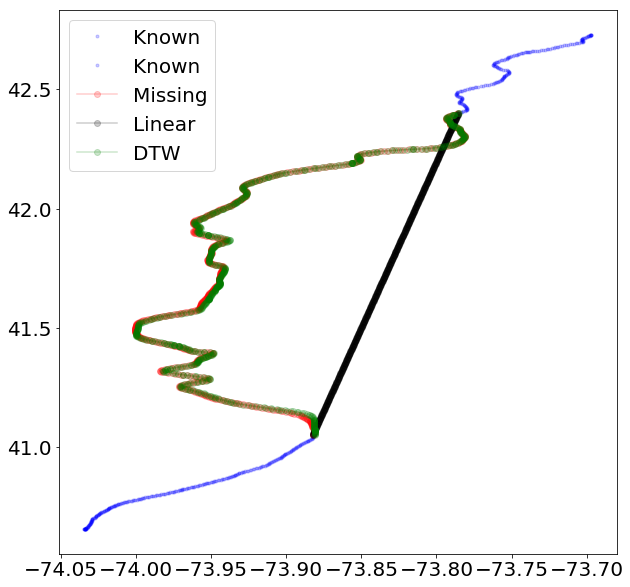

In [167]:
## Visual evaluation after resampling
plt.subplots(figsize=(10,10))
plt.plot(df_p1['LON'], df_p1['LAT'], '.', color = 'blue', label = 'Known', alpha =0.2)
plt.plot(df_p2['LON'], df_p2['LAT'], '.', color = 'blue', label = 'Known', alpha =0.2)
plt.plot(df_miss['LON'], df_miss['LAT'],marker = 'o',color = 'red', label = 'Missing', alpha =0.2)
plt.plot(df_miss['pLON'], df_miss['pLAT'], marker = 'o',color = 'black', label = 'Linear', alpha =0.2)
plt.plot(df_path1['LON'], df_path1['LAT'], marker = 'o',color = 'green', label = 'DTW', alpha =0.2)

plt.legend()

In [161]:
cost_matrix, cost1, alignmend_a, alignmend_b = dtw2d(np.array(df_miss[['LAT','LON']]).copy(order='C'),\
                                                     np.array(df_miss[['pLAT','pLON']]).copy(order='C'))

#### 3.1: Comparison with Linear Interpolation (Metric Method)

In [164]:
print("Similarity Cost Between Linear Prediction and Original: ", str(cost1))
print("Similarity Cost Between DTW Prediction and Original: ", str(cost))
print("The lower the Similarity cost the better is the Prediction")

Similarity Cost Between Linear Prediction and Original:  23145.89073549281
Similarity Cost Between DTW Prediction and Original:  360.9743533088118
The lower the Similarity cost the better is the Prediction
